In [2]:
import numpy as np
import pandas as pd
import PIL.Image
import tensorflow as tf
from functools import partial
from IPython.display import clear_output, Image, display, HTML
from io import BytesIO
tf.__version__

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


'1.14.0'

In [3]:
model = 'tensorflow_inception_graph.pb'
# get to know what this bolierplate does
graph = tf.Graph()
session = tf.InteractiveSession(graph=graph)
with tf.gfile.GFile(model, 'rb') as file:
    graph_definition = tf.GraphDef()
    graph_definition.ParseFromString(file.read())
tensor_input = tf.placeholder(np.float32, name='input')
imagenet_mean = 117.
tensor_preprocessed = tf.expand_dims(tensor_input-imagenet_mean, 0)
tf.import_graph_def(graph_definition, {'input':tensor_preprocessed})

/opt/conda/lib/python3.6/site-packages/tensorflow/python/client/session.py:1735: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [4]:
layer = graph.get_tensor_by_name('input:0')
print(type(layer))
layers = [graph.get_tensor_by_name(tensor.name +':0') for tensor in graph.get_operations()]

<class 'tensorflow.python.framework.ops.Tensor'>


In [5]:
channels=[10, 59, 121, 139]

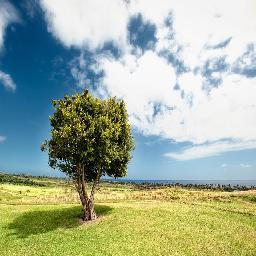

(256, 256, 3)

In [4]:
def showarray(a, fmt='jpeg'):
    # make minus values 0 and over 1 reduce to 1 
    # to fit into [0, 255]
    a = np.uint8(np.clip(a, 0, 1)*255)
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))
    
img_bin = PIL.Image.open('./testing_img/tree.jpeg')
img_bin_resized = img_bin.resize((256, 256))
img_float_resized = np.float32(img_bin_resized)
showarray(img_float_resized/255.0)
img_float_resized.shape

In [10]:
image_tensor = tf.placeholder(dtype=tf.float32,shape=[256, 256, 3])
print(layer.shape)
session.run(layers[150], feed_dict={layer : img_float_resized})

<unknown>


array([[[[ 4.65999374e+01, -1.61894855e+01, -5.41320381e+01, ...,
           9.48686504e+00, -2.57607536e+01,  7.41067028e+00],
         [ 7.14962692e+01, -2.55189171e+01, -6.24876099e+01, ...,
          -1.13671141e+01, -1.07023630e+01, -3.30943184e+01],
         [ 5.35151672e+01, -2.12356339e+01,  4.89758606e+01, ...,
           2.55803623e+01,  2.88717251e+01, -2.20715904e+01],
         ...,
         [ 8.48319340e+00, -7.11473751e+00, -3.22984085e+01, ...,
           3.31034012e+01, -2.19394245e+01,  1.33525953e+01],
         [ 1.49800673e+01,  7.64949083e+00, -5.68015747e+01, ...,
           2.85350857e+01, -3.65302505e+01,  1.47194080e+01],
         [ 1.49180861e+01,  2.46510258e+01, -3.76881676e+01, ...,
           2.13679657e+01, -3.17685680e+01, -1.07828598e+01]],

        [[ 4.63124657e+01, -5.61763039e+01, -5.24939957e+01, ...,
           3.22138863e+01,  2.26586227e+01,  2.53690720e+01],
         [ 3.71848602e+01, -8.22229385e+01, -8.31035995e+01, ...,
           9.42718887e

In [43]:
def visstd(image, s=0.1):
    '''Normalize the image range for visualization'''
    return (image - image.mean())/max(image.std(), 1e-4) * s + 0.5

def render_naive(tensor_object, image=None, iter_n=50, learning_rate=5.0):
    t_score = tf.reduce_mean(tensor_object)
    # produces d_score/d_tensor_input
    t_grad = tf.gradients(t_score, tensor_input)[0]
    copied_image = image.copy()
    for _ in range(iter_n):
        g, _ = session.run([t_grad, t_score], {tensor_input:copied_image})
        # normalizing the gradient, so the same step size should work 
        g /= np.abs(g).mean()         # for different layers and networks
        copied_image += g*learning_rate
    return copied_image



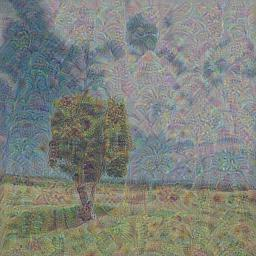

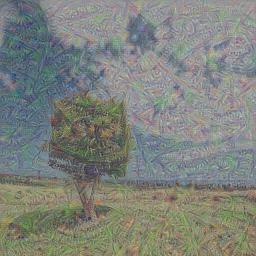

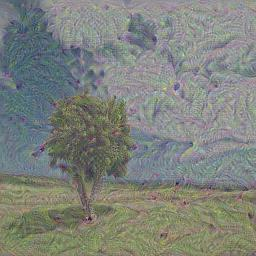

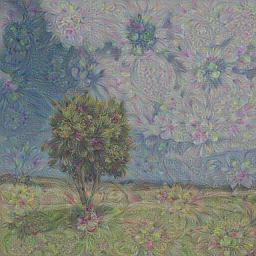

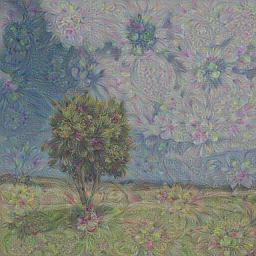

In [44]:
copied_image = img_float_resized.copy()
layer = graph.get_tensor_by_name("import/mixed4d_3x3_bottleneck_pre_relu:0")
for channel in channels:
    tmp_img = render_naive(layer[:,:,:,channel],
                           image=img_float_resized)
    showarray(visstd(tmp_img))
    image = render_naive(layer[:,:,:,channel],
                         image=copied_image)
showarray(visstd(image))
# img_noise = np.random.uniform(size=(224,224,3)) + 100.0
# copied_img_noise = img_noise.copy()
# showarray(visstd(render_naive(layer[:,:,:],
#                               image=copied_img_noise,
#                               iter_n=20,
#                               learning_rate=5.0)))

In [45]:
def tffunc(*argtypes):
    '''Helper that transforms TF-graph generating function into a regular one.
    See "resize" function below.
    '''
    placeholders = list(map(tf.placeholder, argtypes))
    def wrap(f):
        out = f(*placeholders)
        def wrapper(*args, **kw):
            return out.eval(dict(zip(placeholders, args)),
                            session=kw.get('session'))
        return wrapper
    return wrap

def resize(img, size):
    img = tf.expand_dims(img, 0)
    return tf.image.resize_bilinear(img, size)[0,:,:,:]

resize = tffunc(np.float32, np.int32)(resize)


def tiled_grad(image, t_grad, tile_size=512):
    height, width = image.shape[:2]
    shift_x, shift_y = np.random.randint(tile_size, size=2)
    shifted_image = np.roll(np.roll(image, shift_x, axis=1),
                            shift_y, 
                            axis=0)
    gradient = np.zeros_like(image)
    for y in range(0, max(height-tile_size//2, tile_size), tile_size):
        for x in range(0, max(width-tile_size//2, tile_size), tile_size):
            tile =  shifted_image[y:y+tile_size, x:x+tile_size]
            g = session.run(t_grad, {tensor_input: tile})
            gradient[y:y+tile_size, x:x+tile_size] = g
    return np.roll(np.roll(gradient, -shift_x, axis=1),
                   -shift_y,
                   axis=0)
    

def render_with_scalling(tensor_object, image=None, iter_n=10, learning_rate=1.0, num_octaves=3, scaling=1.4):
    t_score = tf.reduce_mean(tensor_object)
    t_grad = tf.gradients(t_score, tensor_input)[0]
    
    image_copy = image.copy()
    for octave in range(num_octaves):
        if octave > 0:
            height_width = np.float32(image_copy.shape[:2]) * scaling
            image_copy = resize(image_copy, np.int32(height_width))
        for _ in range(iter_n):
            g = tiled_grad(image_copy, t_grad)
            g /= np.abs(g).mean()  
            image_copy += (g * learning_rate)
    return image_copy


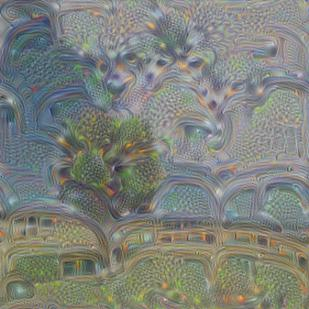

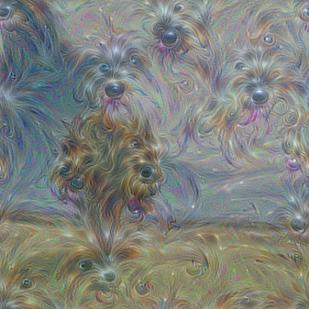

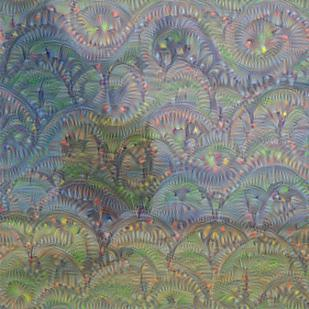

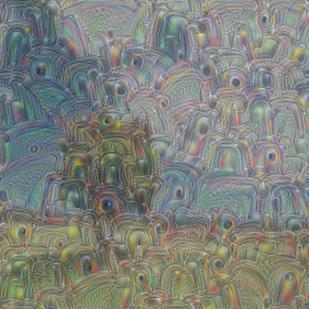

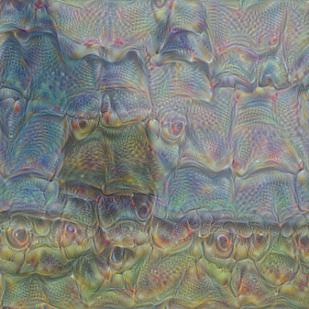

...

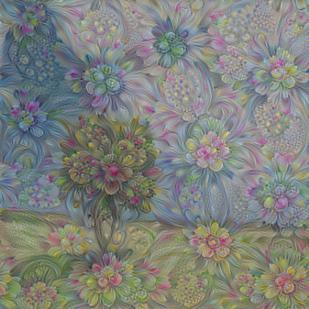

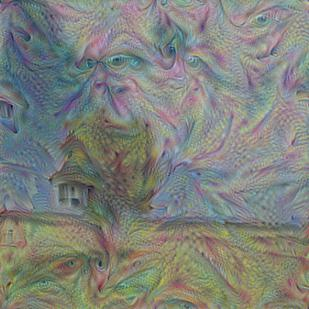

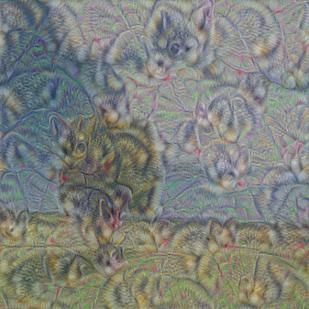

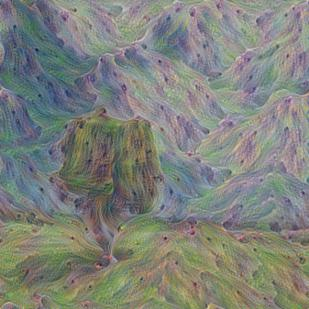

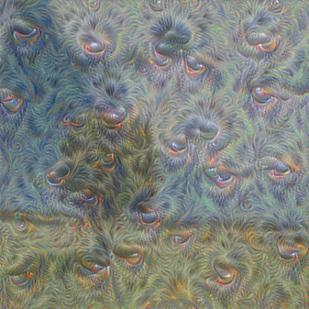

In [46]:
for channel in range(144):
    tmp_img = render_with_scalling(layer[:,:,:,channel],
                                   image=img_float_resized, 
                                   num_octaves=3,
                                   scaling=1.1, 
                                   iter_n=50,
                                   learning_rate=3.5)
    showarray(visstd(tmp_img))

In [47]:
k = np.float32([1, 4, 6, 4, 1])
k = np.outer(k, k)
k5x5 = k[:,:,None,None] / k.sum() * np.eye(3, dtype=np.float32)


def laplacian_split(img):
    '''Splits the image into lo and hi frequency components'''
    with tf.name_scope('split'):
        low = tf.nn.conv2d(img, k5x5, [1, 2, 2, 1], 'SAME')
        low_2 = tf.nn.conv2d_transpose(low, k5x5*4, tf.shape(img), [1, 2, 2, 1])
        high = img - low_2
    return low, high


def laplacian_split_n(img, scale):
    levels = []
    for _ in range(scale):
        img, high = laplacian_split(img)
        levels.append(high)
    levels.append(img)
    return levels[::-1]


def normalize_image(img, epsilon=1e-10):
    with tf.name_scope('normalize'):
        std_deviation = tf.sqrt(tf.reduce_mean(tf.square(img)))
        return img/tf.maximum(std_deviation, epsilon)


def laplacian_merge(levels):
    img = levels[0]
    for high in levels[1:]:
        with tf.name_scope('merge'):
            img = tf.nn.conv2d_transpose(img, k5x5*4, tf.shape(high), [1, 2, 2, 1]) + high
    return img

def laplacian_normalization(img, scale=4):
    img = tf.expand_dims(img, 0)
    pyramid_levels = laplacian_split_n(img, scale)
    pyramid_levels = list(map(normalize_image, pyramid_levels))
    out = laplacian_merge(pyramid_levels)
    return out[0,:,:,:]



In [48]:
def render_laplacian_norm(tensor_object,
                          image=None,
                          iter_n=10,
                          learning_rate=1.0,
                          num_octaves=3,
                          scaling=1.4,
                          lap_n=4):
    t_score = tf.reduce_mean(tensor_object)
    t_grad = tf.gradients(t_score, tensor_input)[0]
    
    laplacian_normalization_func = tffunc(np.float32)(partial(laplacian_normalization, scale=lap_n))
    
    image_copy = image.copy()
    for octave in range(num_octaves):
        if octave > 0:
            height_width = np.float32(image_copy.shape[:2]) * scaling
            image_copy = resize(image_copy, np.int32(height_width))
        for _ in range(iter_n):
            gradient = tiled_grad(image_copy, t_grad)
            gradient = laplacian_normalization_func(gradient)
            image_copy += gradient * learning_rate
    return image_copy


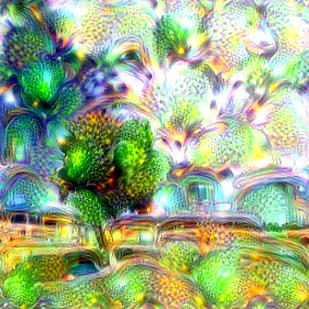

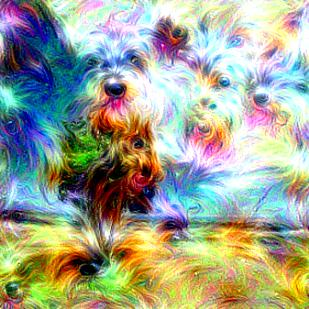

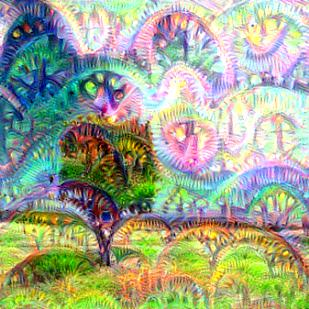

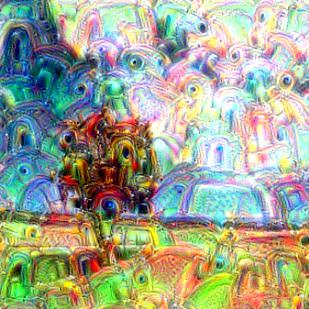

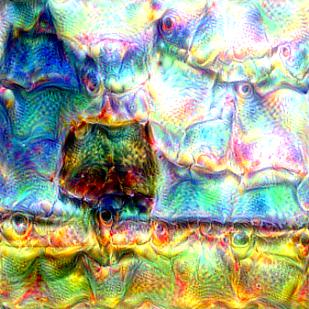

...

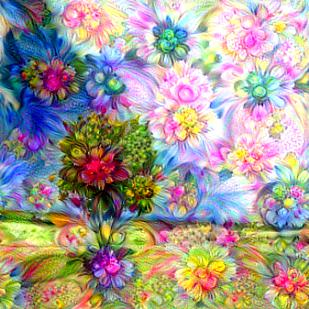

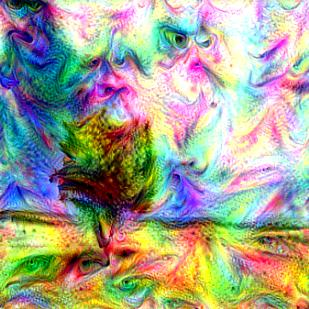

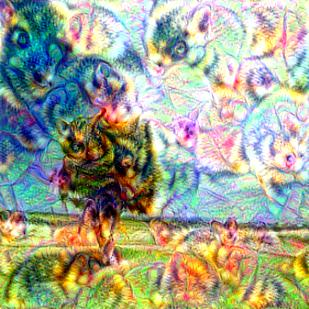

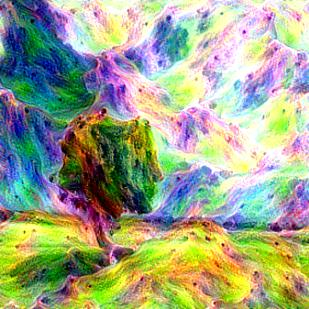

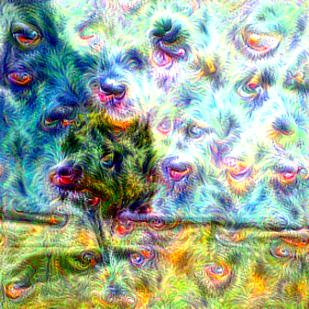

In [49]:
# # render_laplacian_norm(layer[:,:,:,2],
# #                       image=img_float_resized,
# #                       num_octaves=4,
# #                       scaling=1.1,
# #                       iter_n=100,
# #                       learning_rate=3.5)
for i in range(144):
    tmp_img = render_laplacian_norm(layer[:,:,:,i],
                                    image=img_float_resized, 
                                    num_octaves=3,
                                    scaling=1.1, 
                                    iter_n=10,
                                    learning_rate=3.5)
    showarray(tmp_img/255)

In [34]:
def deepdream(tensor_object, img0=None, iter_n=10, learning_rate=1.0, num_octaves=3, scaling=1.4):
    image_octaves = img0.copy()
    octaves = []
    t_mean = tf.reduce_mean(tensor_object)
    t_grad = tf.gradients(t_mean, tensor_input)[0]
    for i in range(num_octaves):
        height_width = image_octaves.shape[:2]
        low = resize(image_octaves, np.int32(np.float32(height_width)/scaling))
        high = image_octaves - resize(low, height_width)
        image_octaves = low
        octaves.append(high)

    for index, octave in enumerate(octaves):
        if index > 0:
            high = octaves[-index]
            image_octaves = resize(image_octaves, high.shape[:2]) + high
        for i in range(iter_n):
            gradient = tiled_grad(image_octaves, t_grad)
            image_octaves += gradient*(learning_rate / (np.abs(gradient).mean()+1e-7))
        clear_output()
        showarray(image_octaves/255.)
    return image_octaves


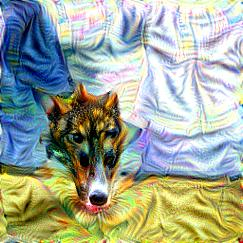

array([[[108.455025 , 142.05008  , 153.93916  ],
        [ 71.95295  , 158.13715  , 213.84747  ],
        [ 46.619965 , 124.16268  , 241.87631  ],
        ...,
        [266.215    , 240.10536  , 183.96645  ],
        [241.31932  , 264.31705  , 176.98486  ],
        [211.14566  , 221.08116  , 173.45325  ]],

       [[123.65375  , 118.23615  , 120.42545  ],
        [ 68.57738  , 132.2859   , 170.48253  ],
        [ 43.066566 , 121.63378  , 199.45671  ],
        ...,
        [234.62839  , 286.1695   , 250.78833  ],
        [190.74622  , 246.35379  , 213.73067  ],
        [175.67084  , 227.64217  , 209.08842  ]],

       [[ 19.639816 ,   2.7864132,  50.137142 ],
        [ 42.52518  ,  84.6494   , 130.55121  ],
        [ 68.01557  , 124.25691  , 196.9088   ],
        ...,
        [226.63257  , 274.01846  , 273.5552   ],
        [122.62925  , 159.11513  , 208.22101  ],
        [ 77.14282  , 114.37587  , 177.15092  ]],

       ...,

       [[135.07803  , 180.22932  , 124.018394 ],
        [15

In [35]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4d_3x3_pre_relu:0')),
          img_float_resized,
          iter_n=15,
          learning_rate=2.5,
          num_octaves=15,
          scaling=1.05)

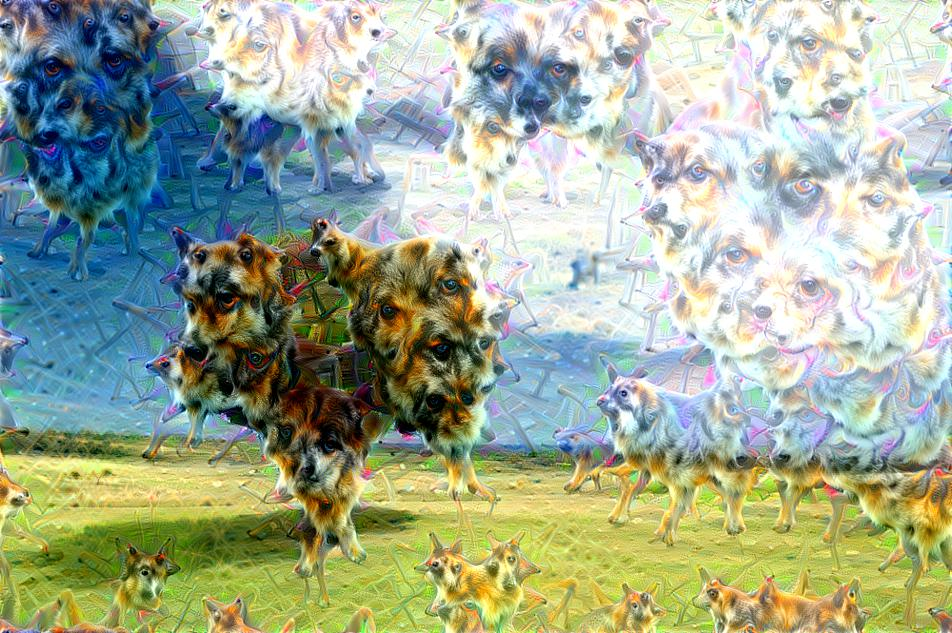

array([[[199.78874 , 154.85616 , 159.01335 ],
        [223.6771  , 208.42715 , 183.80283 ],
        [ 97.91609 ,  96.547386, 119.66747 ],
        ...,
        [254.1142  , 250.66763 , 283.1091  ],
        [236.11339 , 223.169   , 226.34767 ],
        [227.03226 , 210.34843 , 222.01329 ]],

       [[132.84274 ,  98.649864, 118.14416 ],
        [189.76189 , 162.08517 , 167.00912 ],
        [106.60475 ,  66.231316, 110.87202 ],
        ...,
        [275.0145  , 264.16983 , 282.4403  ],
        [280.7669  , 255.22551 , 265.37198 ],
        [243.13608 , 228.19345 , 226.89954 ]],

       [[117.840996,  68.195045,  87.10918 ],
        [125.52747 , 123.22627 , 149.34851 ],
        [ 68.45048 ,  79.22332 , 107.38289 ],
        ...,
        [263.3108  , 262.56967 , 270.04132 ],
        [302.26746 , 285.8696  , 287.90305 ],
        [261.605   , 228.25363 , 230.55447 ]],

       ...,

       [[250.60777 , 165.3801  , 132.98909 ],
        [286.62283 , 234.27213 , 164.70023 ],
        [304.68814 , 2

In [16]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4c_5x5_pre_relu:0')),
          img_float_resized,
          iter_n=100,
          learning_rate=0.5,
          num_octaves=15,
          scaling=1.05)

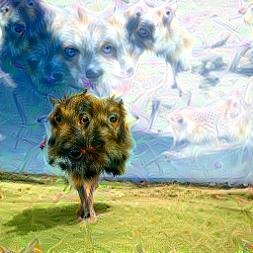

array([[[162.21988 , 133.72249 , 130.77603 ],
        [120.493645,  81.07352 , 141.87006 ],
        [ 70.090744,  65.72846 , 149.62532 ],
        ...,
        [224.6309  , 219.96518 , 223.67143 ],
        [235.88907 , 224.25276 , 210.83244 ],
        [294.00702 , 246.08907 , 213.48459 ]],

       [[105.22967 , 115.00972 , 142.51892 ],
        [ 87.10166 ,  66.08941 , 122.45779 ],
        [ 76.14454 ,  95.0622  , 137.89133 ],
        ...,
        [232.11812 , 233.26994 , 220.4273  ],
        [291.4883  , 253.24806 , 202.36946 ],
        [304.2101  , 278.36804 , 216.36559 ]],

       [[ 91.83503 ,  60.166325, 130.79367 ],
        [ 87.12354 ,  84.14412 , 131.28777 ],
        [ 95.1272  , 129.31647 , 142.45534 ],
        ...,
        [261.34113 , 285.52576 , 242.73195 ],
        [275.73685 , 278.08005 , 235.37512 ],
        [255.41847 , 257.38614 , 221.36673 ]],

       ...,

       [[171.89671 , 170.48297 ,  41.97224 ],
        [196.06972 , 156.13965 ,  62.17244 ],
        [173.1839  , 1

In [36]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4c_5x5_pre_relu:0')),
          img_float_resized,
          iter_n=50,
          learning_rate=0.5,
          num_octaves=5,
          scaling=1.01)

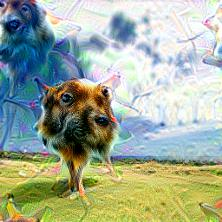

array([[[153.46223 , 117.435295, 172.45073 ],
        [ 87.02992 ,  80.09275 , 168.19868 ],
        [ 95.610085,  65.52012 , 169.13437 ],
        ...,
        [236.85028 , 186.22414 , 216.91507 ],
        [340.62292 , 243.18037 , 249.66211 ],
        [379.34323 , 298.47314 , 280.17633 ]],

       [[ 88.16859 ,  98.260475, 157.42697 ],
        [ 96.06613 , 100.34663 , 158.43727 ],
        [101.10469 , 100.64088 , 179.31322 ],
        ...,
        [253.90544 , 196.38377 , 218.8282  ],
        [301.7314  , 262.7476  , 260.8811  ],
        [295.25934 , 300.79407 , 283.84714 ]],

       [[ 42.893944,  41.214348, 131.0605  ],
        [ 96.45985 , 114.84847 , 146.13603 ],
        [109.04189 , 138.12155 , 183.85417 ],
        ...,
        [270.64783 , 227.18625 , 241.87285 ],
        [280.92612 , 306.51215 , 276.63013 ],
        [219.41533 , 296.70615 , 282.151   ]],

       ...,

       [[237.48734 , 114.41385 ,  89.5743  ],
        [192.78009 , 128.94467 ,  89.726875],
        [146.26111 , 1

In [37]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4c_5x5_pre_relu:0')),
          img_float_resized,
          iter_n=100,
          learning_rate=0.5,
          num_octaves=5,
          scaling=1.15)

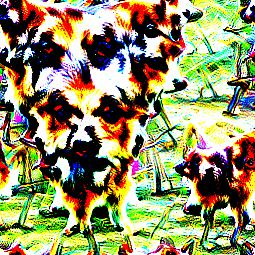

array([[[2977.3093   , 2565.623    , 2958.8242   ],
        [ 587.48346  , -151.72142  ,  202.05531  ],
        [ 116.55647  ,   -6.7308545,  873.1226   ],
        ...,
        [1041.1768   , 1004.366    , 1020.1671   ],
        [2746.673    , 3118.1714   , 3544.7312   ],
        [2654.0747   , 2804.7085   , 4974.3765   ]],

       [[ 830.2661   , 1409.0731   , 3204.9924   ],
        [ 272.60632  , -662.53937  , -382.3103   ],
        [ 370.83392  ,  179.60886  ,  983.7577   ],
        ...,
        [1373.2963   , 1200.1138   , 2540.4714   ],
        [3294.3738   , 3845.4338   , 4740.5537   ],
        [2811.9302   , 2417.9346   , 2432.852    ]],

       [[ 456.54916  ,   29.004232 ,  325.46887  ],
        [ 984.40625  , 1038.059    , 1591.7029   ],
        [1758.7222   , 1920.4209   , 2284.3123   ],
        ...,
        [1984.247    , 2171.667    , 3191.146    ],
        [2523.9478   , 2454.6616   , 3058.7788   ],
        [1873.5212   , 1492.0012   , 1382.6829   ]],

       ...,

      

In [38]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4c_5x5_pre_relu:0')),
          img_float_resized,
          iter_n=300,
          learning_rate=5.,
          num_octaves=60,
          scaling=1.0005)

mixed3b_3x3_pre_relu - dziwne dziury
conv2d1_pre_relu - pionowe linie

https://www.cs.utah.edu/~arul/report/node12.html
https://github.com/tensorflow/tensorflow/blob/master/tensorflow/examples/tutorials/deepdream/deepdream.ipynb
https://github.com/Hvass-Labs/TensorFlow-Tutorials/blob/master/14_DeepDream.ipynb
https://github.com/google/deepdream/blob/master/dream.ipynb
https://codesachin.wordpress.com/tag/deepdream/

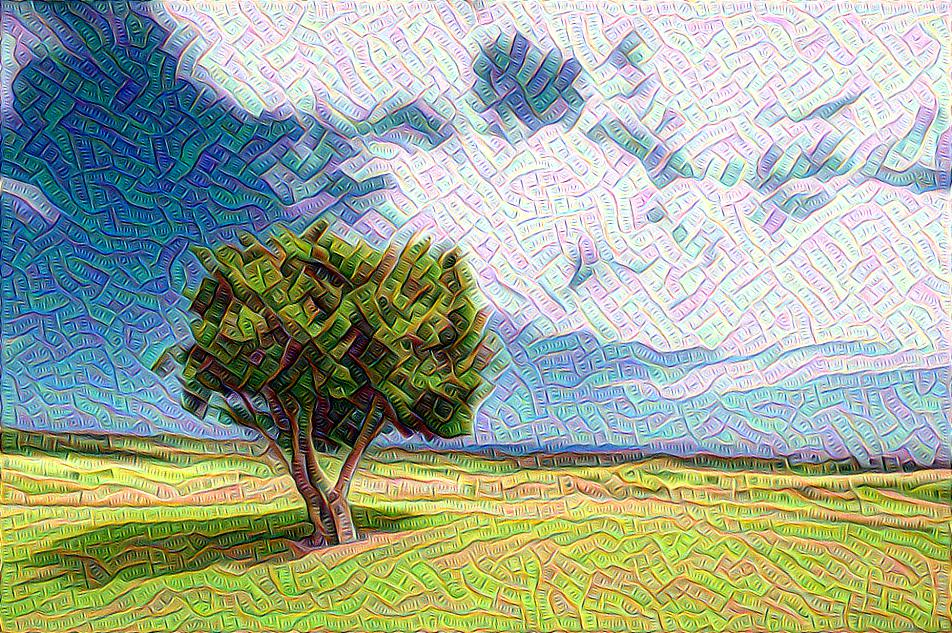

In [24]:
linear_image = deepdream(tf.square(graph.get_tensor_by_name('import/mixed3a_3x3_bottleneck_pre_relu:0')),
          img_float_resized,
          iter_n=10,
          learning_rate=5.,
          num_octaves=5,
          scaling=1.05)

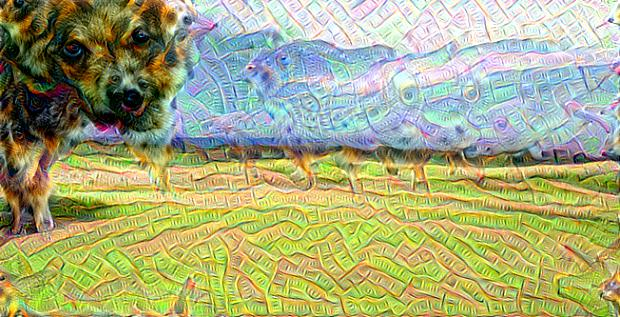

In [25]:
image_doggo = deepdream(tf.square(graph.get_tensor_by_name('import/mixed4c_5x5_pre_relu:0')),
          linear_image[300:1200,300:1200],
          iter_n=20,
          learning_rate=.5,
          num_octaves=15,
          scaling=1.05)

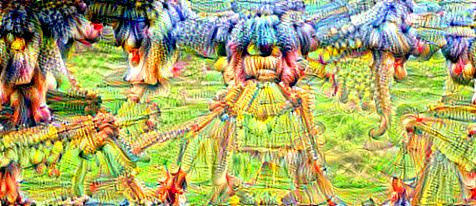

array([[[-29.4726   , -75.98114  ,  18.054249 ],
        [-33.24733  , -55.10211  ,  31.541838 ],
        [ -2.6709855,  -7.635496 ,  14.900661 ],
        ...,
        [280.21127  , 307.7622   , 202.80803  ],
        [232.45233  , 314.71936  , 265.9805   ],
        [226.50635  , 233.4588   , 299.5277   ]],

       [[ 96.95104  ,  69.9179   ,  25.901234 ],
        [-11.679546 ,  -1.7458066,  62.236145 ],
        [-79.74704  , -45.836594 ,  62.943146 ],
        ...,
        [243.08868  , 270.96396  , 232.34277  ],
        [241.8021   , 292.33612  , 241.08527  ],
        [269.60437  , 240.44075  , 211.68454  ]],

       [[ 53.818935 , 121.11091  ,  53.432106 ],
        [ 65.45008  , 101.15115  ,  73.80617  ],
        [ 23.83506  ,  32.539524 ,  22.92603  ],
        ...,
        [100.10922  ,  89.8052   , 165.9791   ],
        [125.94932  ,  68.8043   , 151.02682  ],
        [143.28204  ,  59.8294   , 142.21782  ]],

       ...,

       [[247.60246  , 220.91211  , 114.06588  ],
        [11

In [26]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed5b_5x5_pre_relu:0')),
          image_doggo[100:400,:500],
          iter_n=20,
          learning_rate=3.,
          num_octaves=15,
          scaling=1.05)

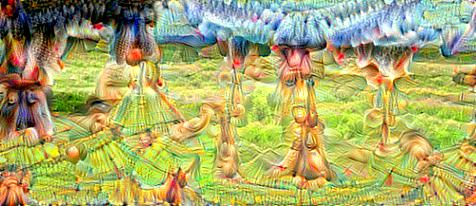

array([[[ -63.70506  , -118.04414  ,   32.62049  ],
        [  62.43941  ,  -43.173542 ,   23.247343 ],
        [ 103.66043  ,   14.801237 ,    2.8488097],
        ...,
        [ 166.23367  ,  160.54152  ,  220.2205   ],
        [ 143.02066  ,  161.67163  ,  226.29453  ],
        [  84.5265   ,  101.17845  ,  214.14139  ]],

       [[ -90.629906 , -114.81087  ,    9.679595 ],
        [ -44.18625  , -120.26865  ,   -3.7985587],
        [   8.224797 ,  -35.80896  ,   23.164276 ],
        ...,
        [ 233.62314  ,  158.61716  ,  187.64627  ],
        [ 211.19736  ,  223.90245  ,  200.8109   ],
        [ 136.29785  ,  188.32399  ,  160.18935  ]],

       [[  62.951557 ,   79.00794  ,   72.436386 ],
        [  -3.743526 ,   16.480396 ,   31.492718 ],
        [   8.842442 ,    4.5426683,   -0.7017497],
        ...,
        [ 177.96649  ,   48.586033 ,   89.84994  ],
        [ 213.84517  ,  163.23772  ,  130.75095  ],
        [ 216.10785  ,  250.07048  ,  158.28944  ]],

       ...,

      

In [27]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed5b_5x5_pre_relu:0')),
          image_doggo[100:400,:500],
          iter_n=30,
          learning_rate=1.5,
          num_octaves=15,
          scaling=1.05)

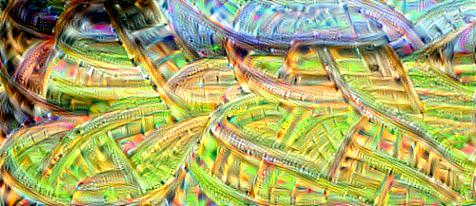

array([[[ 6.80081940e+01,  1.04211624e+02,  9.52503738e+01],
        [ 6.75332031e+01,  7.73095398e+01,  2.59784546e+01],
        [ 4.25761795e+01,  9.65711594e+01,  1.89634037e+01],
        ...,
        [ 1.70139206e+02,  2.23417252e+02,  1.95594421e+02],
        [ 1.79046936e+02,  2.29089447e+02,  2.23247437e+02],
        [ 2.35138611e+02,  2.89249420e+02,  3.21837738e+02]],

       [[ 4.61433258e+01,  1.04607750e+02,  4.98620758e+01],
        [-2.06795037e-01,  2.80145149e+01,  2.38468742e+01],
        [-8.99493122e+00,  3.22168961e+01,  4.00010376e+01],
        ...,
        [ 1.47279541e+02,  1.92370590e+02,  1.88178162e+02],
        [ 1.62250534e+02,  2.20729645e+02,  2.26652222e+02],
        [ 2.13068207e+02,  2.95010345e+02,  2.55535980e+02]],

       [[ 9.80808868e+01,  6.53318253e+01,  4.80751801e+01],
        [-4.51506310e+01,  1.01908636e+01,  2.99842815e+01],
        [-7.08507385e+01, -6.77280712e+00,  5.83893919e+00],
        ...,
        [ 9.46315384e+01,  1.83750809e+02,

In [28]:
deepdream(tf.square(graph.get_tensor_by_name('import/mixed4a_5x5_pre_relu:0')),
          image_doggo[100:400,:500],
          iter_n=10,
          learning_rate=3.,
          num_octaves=10,
          scaling=1.05)

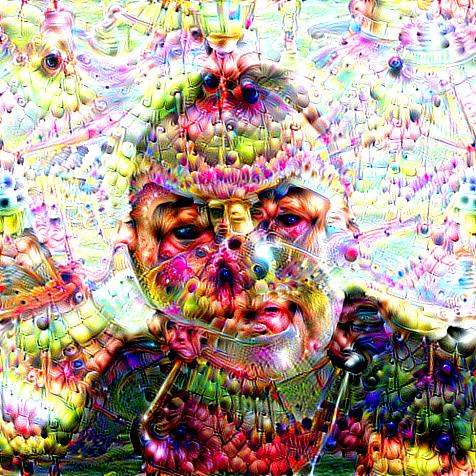

array([[[333.1927  , 328.4281  , 249.27397 ],
        [391.1636  , 375.7484  , 316.22635 ],
        [439.92703 , 418.23825 , 395.91428 ],
        ...,
        [292.47552 , 275.88885 , 194.0019  ],
        [288.33807 , 248.48582 , 222.46799 ],
        [276.70908 , 264.2278  , 250.6116  ]],

       [[270.36417 , 297.25952 , 289.12766 ],
        [301.44275 , 307.60342 , 316.02924 ],
        [306.76938 , 289.69904 , 263.0456  ],
        ...,
        [271.7093  , 265.60858 , 188.5835  ],
        [315.82693 , 293.91202 , 235.0508  ],
        [319.7964  , 285.31406 , 251.89194 ]],

       [[284.0569  , 286.14737 , 243.39253 ],
        [292.52588 , 238.78143 , 261.34543 ],
        [298.8283  , 254.27768 , 249.53322 ],
        ...,
        [249.23354 , 196.8071  , 173.10503 ],
        [294.69226 , 328.10617 , 230.1684  ],
        [299.32556 , 292.20963 , 223.87639 ]],

       ...,

       [[127.14437 ,  24.31418 ,  39.911217],
        [ 66.85037 ,  70.56158 , 127.366585],
        [ 71.24391 ,  

In [32]:
img_float_resized = np.float32(PIL.Image.open('kabanos.jpg').resize((500, 500)))
layer = graph.get_tensor_by_name('import/mixed5a_3x3_bottleneck_pre_relu:0')
deepdream(layer,
          img_float_resized,
          iter_n=50,
          learning_rate=3.,
          num_octaves=10,
          scaling=1.05)

## Controlled dreaming

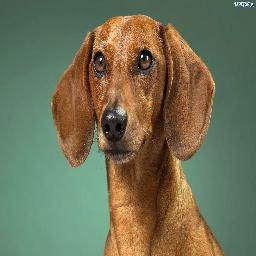

In [5]:
guide = PIL.Image.open('./testing_img/jamnik.jpg')
guide = np.float32(guide.resize((256, 256)))
showarray(guide/255)

In [17]:
layer = graph.get_tensor_by_name('import/mixed3b_3x3:0')
guided_features = session.run(layer, feed_dict={tensor_input: guide})

In [18]:
guided_features.shape

(1, 32, 32, 192)

In [ ]:
def objective_guide(dst):
    x = dst.data[0].copy()
    y = guide_features
    ch = x.shape[0]
    x = x.reshape(ch,-1)
    y = y.reshape(ch,-1)
    A = x.T.dot(y) # compute the matrix of dot-products with guide features
    dst.diff[0].reshape(ch,-1)[:] = y[:,A.argmax(1)] # select ones that match best